In [1]:
print("hello")

hello


In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch import nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
from torchvision.transforms import functional as TF
from PIL import Image
import torchvision
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def show_images(loader):
    images, labels = next(iter(loader))
    grid_img = torchvision.utils.make_grid(images, nrow=8)
    plt.figure(figsize=(12, 12))
    plt.imshow(grid_img.permute(1, 2, 0).numpy())
    plt.axis('off')
    plt.show()



In [4]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split

# Define the transformations for STL-10 dataset
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Load the STL-10 training dataset
trainset_full = torchvision.datasets.STL10(root='./data',  split='train+unlabeled', download=True, transform=transform)

# Split the training dataset into train and validation sets (80% train, 20% validation)
train_size = int(0.8 * len(trainset_full))
val_size = len(trainset_full) - train_size
trainset, valset = random_split(trainset_full, [train_size, val_size])

# Create DataLoader for the train set
trainloader = DataLoader(trainset, batch_size=64, shuffle=True)

# Create DataLoader for the validation set
valloader = DataLoader(valset, batch_size=64, shuffle=False)

# Load the STL-10 test dataset
testset = torchvision.datasets.STL10(root='./data', split='test', download=True, transform=transform)
testloader = DataLoader(testset, batch_size=64, shuffle=False)

# Example: Check the sizes of the datasets
print(f"Train set size: {train_size}")
print(f"Validation set size: {val_size}")
print(f"Test set size: {len(testset)}")



Files already downloaded and verified
Files already downloaded and verified
Train set size: 84000
Validation set size: 21000
Test set size: 8000


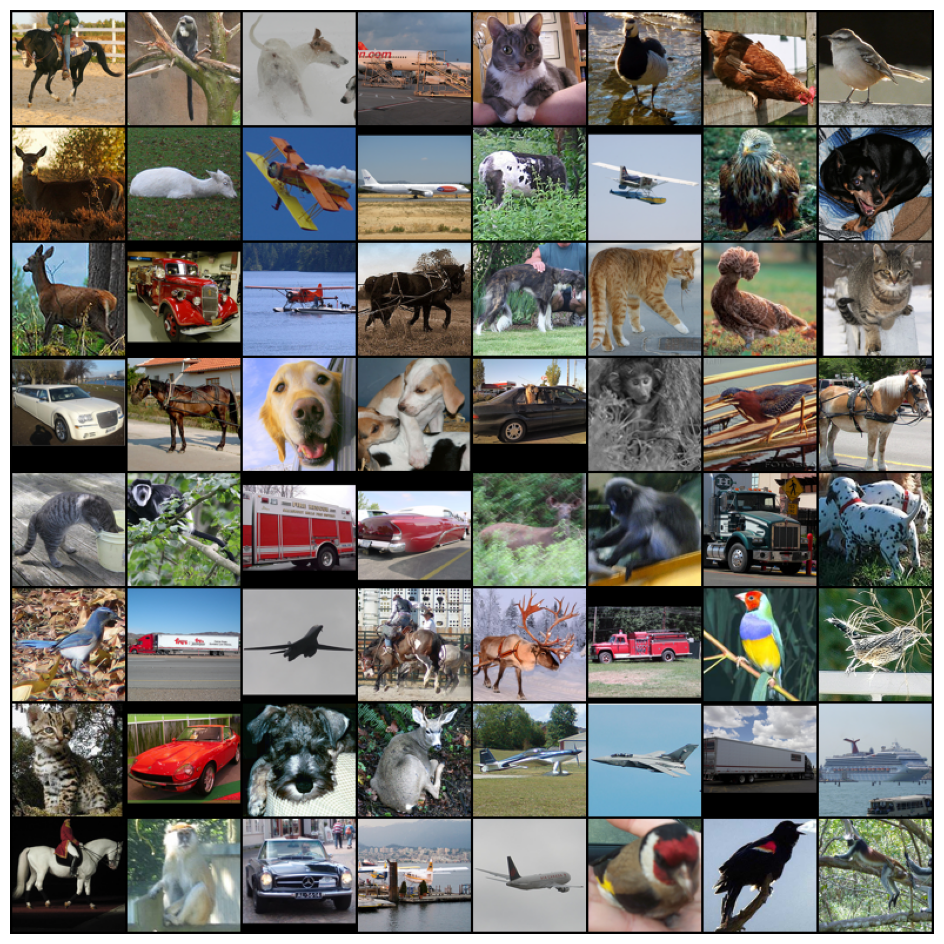

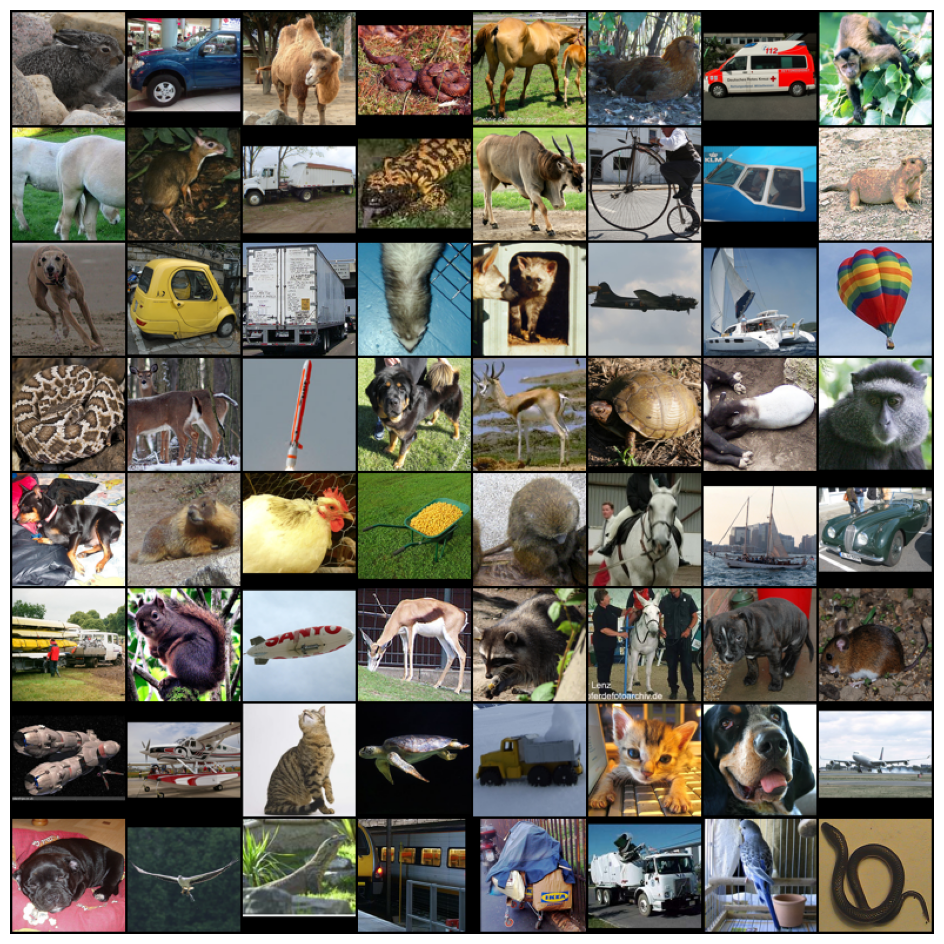

In [5]:
# Show images from the training set
show_images(testloader)
show_images(trainloader)

In [6]:
import random

class RotateDataset(torch.utils.data.Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
    
    def __getitem__(self, index):
        img, label = self.dataset[index]
        rotation_label = random.choice([0, 1, 2, 3])  # 0 = 0°, 1 = 90°, 2 = 180°, 3 = 270°
        img = transforms.functional.rotate(img, rotation_label * 90)
        return img, rotation_label  # Return rotated image and rotation label
    
    def __len__(self):
        return len(self.dataset)

# Use the RotateDataset to add rotation augmentation
rot_trainset = RotateDataset(trainset)
rot_trainloader = torch.utils.data.DataLoader(rot_trainset, batch_size=64, shuffle=True)


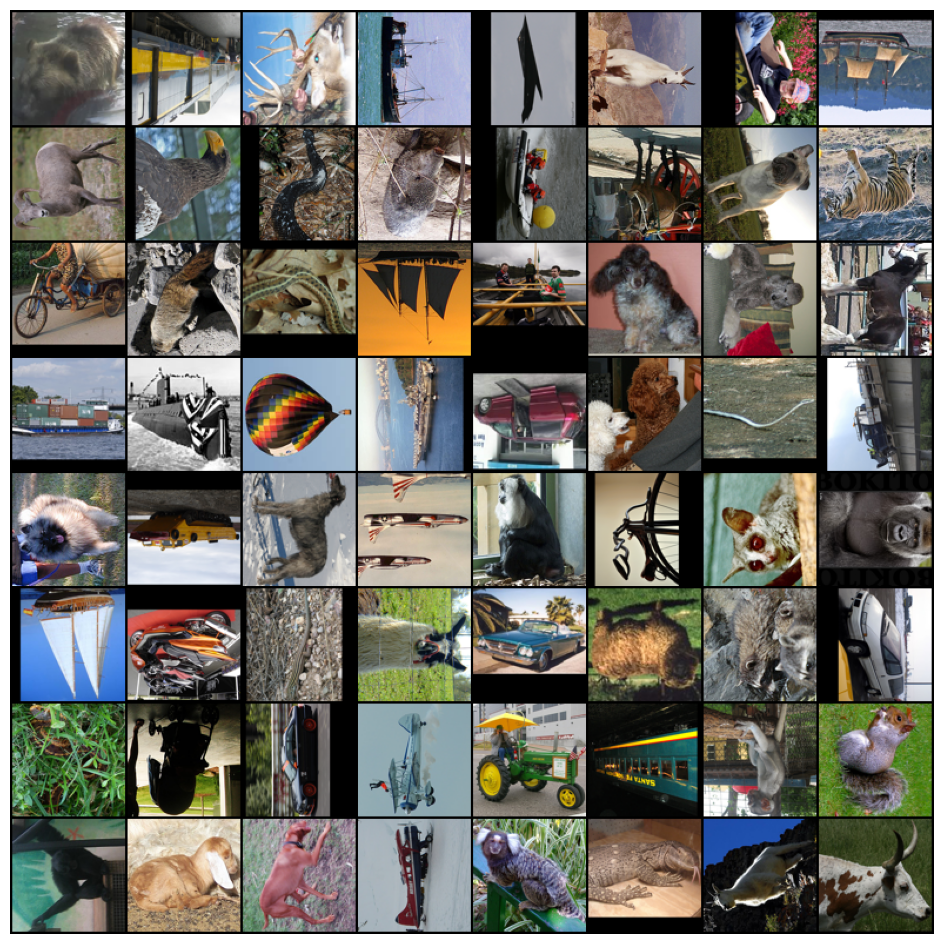

In [7]:
show_images(rot_trainloader)


In [8]:
import torch
import torch.nn as nn
import torchvision.models as models

# Base ResNet Backbone for both tasks
class ResNetBase(nn.Module):
    def __init__(self):
        super(ResNetBase, self).__init__()
        self.backbone = models.resnet18(weights=None)
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-2])  # Remove last fully connected layer

    def forward(self, x):
        return self.backbone(x)

# Jigsaw ResNet model
class JigsawResNet(nn.Module):
    def __init__(self, num_patches, num_permutations):
        super(JigsawResNet, self).__init__()
        self.base = ResNetBase()  # Use the shared ResNet base
        self.fc = nn.Sequential(
            nn.Linear(512 * num_patches, 1024),
            nn.ReLU(),
            nn.Linear(1024, num_permutations)
        )

    def forward(self, x):
        batch_size, num_patches, channels, height, width = x.shape
        patches = []

        for i in range(num_patches):
            patch_features = self.base(x[:, i])  # Extract features for each patch
            patch_features = torch.flatten(patch_features, start_dim=1)
            patches.append(patch_features)

        concatenated_features = torch.cat(patches, dim=1)
        output = self.fc(concatenated_features)
        return output

# Rotation ResNet model
class ResNetRotation(nn.Module):
    def __init__(self):
        super(ResNetRotation, self).__init__()
        self.base = ResNetBase()  # Use the shared ResNet base
        self.fc = nn.Linear(512, 4)  # Output classes: 0, 90, 180, 270 degrees

    def forward(self, x):
        x = self.base(x)
        x = nn.functional.adaptive_avg_pool2d(x, (1, 1))
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

# Initialize the models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_permutations = 1000
num_patches = 9

jigsaw_model = JigsawResNet(num_patches=num_patches, num_permutations=num_permutations).to(device)
rotation_model = ResNetRotation().to(device)

# Initialize weights (common function)
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

jigsaw_model.apply(weights_init)
rotation_model.apply(weights_init)

# Now proceed with training the rotation model as you outlined before.


ResNetRotation(
  (base): ResNetBase(
    (backbone): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, e

In [9]:
# Create DataLoader for rotated datasets
rot_trainset = RotateDataset(trainset)
rot_valset = RotateDataset(valset)
rot_trainloader = DataLoader(rot_trainset, batch_size=64, shuffle=True)
rot_valloader = DataLoader(rot_valset, batch_size=64, shuffle=False)

# Initialize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Define the loss function (CrossEntropyLoss) and the optimizer (Adam)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(rotation_model.parameters(), lr=0.001)

Epoch 1, Train Loss: 0.9676, Val Loss: 1.1524
Epoch 2, Train Loss: 0.7551, Val Loss: 0.7329
Epoch 3, Train Loss: 0.6647, Val Loss: 0.6616
Epoch 4, Train Loss: 0.6006, Val Loss: 0.7316
Epoch 5, Train Loss: 0.5490, Val Loss: 0.6126
Epoch 6, Train Loss: 0.5108, Val Loss: 0.5127
Epoch 7, Train Loss: 0.4732, Val Loss: 0.5226
Epoch 8, Train Loss: 0.4420, Val Loss: 0.4832
Epoch 9, Train Loss: 0.4158, Val Loss: 0.5054
Epoch 10, Train Loss: 0.3915, Val Loss: 0.4520
Epoch 11, Train Loss: 0.3674, Val Loss: 0.5439
Epoch 12, Train Loss: 0.3447, Val Loss: 0.4484
Epoch 13, Train Loss: 0.3260, Val Loss: 0.4341
Epoch 14, Train Loss: 0.3102, Val Loss: 0.4147
Epoch 15, Train Loss: 0.2877, Val Loss: 0.4854
Epoch 16, Train Loss: 0.2683, Val Loss: 0.4235
Epoch 17, Train Loss: 0.2531, Val Loss: 0.4873
Epoch 18, Train Loss: 0.2362, Val Loss: 0.4491
Epoch 19, Train Loss: 0.2213, Val Loss: 0.4331
Epoch 20, Train Loss: 0.2057, Val Loss: 0.4453
Epoch 21, Train Loss: 0.1922, Val Loss: 0.5093
Epoch 22, Train Loss: 

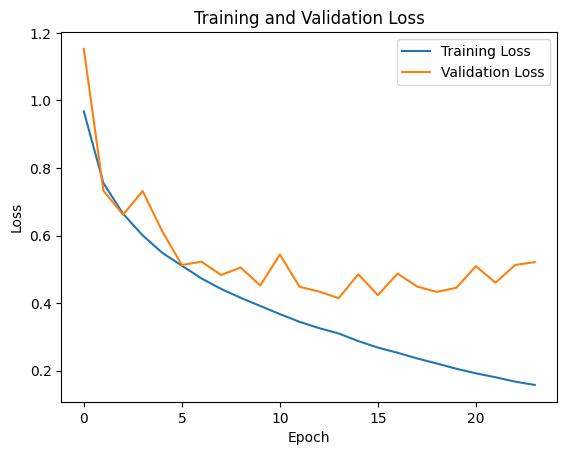

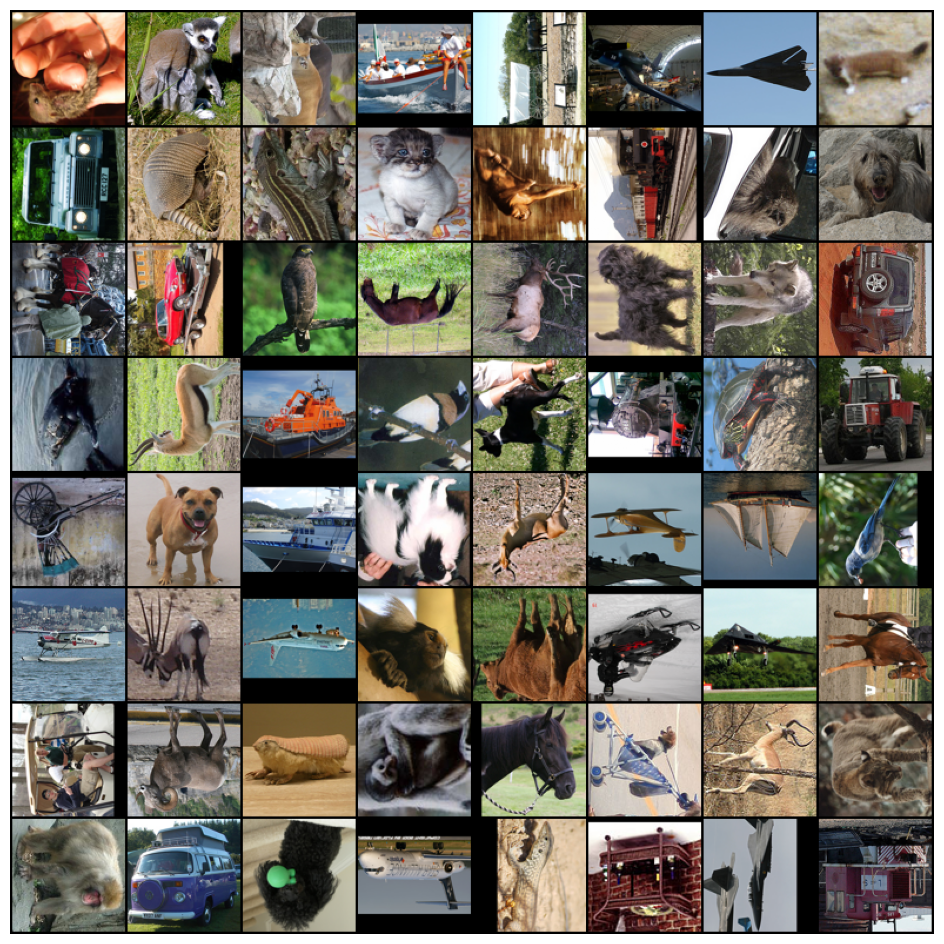

In [9]:
# Create DataLoader for rotated datasets
rot_trainset = RotateDataset(trainset)
rot_valset = RotateDataset(valset)
rot_trainloader = DataLoader(rot_trainset, batch_size=64, shuffle=True)
rot_valloader = DataLoader(rot_valset, batch_size=64, shuffle=False)

# Initialize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Define the loss function (CrossEntropyLoss) and the optimizer (Adam)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(rotation_model.parameters(), lr=0.001)

# Prepare for training
num_epochs = 100  # Adjust epochs as needed
patience = 10
best_val_loss = float('inf')
patience_counter = 0
train_losses = []
val_losses = []

# Training loop
for epoch in range(num_epochs):
    # Training phase
    rotation_model.train()
    running_loss = 0.0
    for images, labels in rot_trainloader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        # Forward pass
        outputs = rotation_model(images)

        # Compute loss (CrossEntropyLoss automatically applies softmax internally)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_loss = running_loss / len(rot_trainloader)
    train_losses.append(train_loss)

    # Validation phase
    rotation_model.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for images, labels in rot_valloader:
            images, labels = images.to(device), labels.to(device)
            outputs = rotation_model(images)

            # Compute validation loss
            val_loss = criterion(outputs, labels)
            running_val_loss += val_loss.item()

    val_loss = running_val_loss / len(rot_valloader)
    val_losses.append(val_loss)

    print(f'Epoch {epoch + 1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        # Save the model
        torch.save(rotation_model.state_dict(), 'jigsaw_rotation_pretext_cross_entropy_model_STL10.pth')
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# Plot training and validation losses
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# Function to show images
def show_images(loader):
    images, labels = next(iter(loader))
    grid_img = torchvision.utils.make_grid(images, nrow=8)
    plt.figure(figsize=(12, 12))
    plt.imshow(grid_img.permute(1, 2, 0).numpy())
    plt.axis('off')
    plt.show()

# Show some example images
show_images(rot_trainloader)

Files already downloaded and verified
Files already downloaded and verified


/tmp/ipykernel_1718765/1327484874.py:58: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  rotation_weights = torch.load(rotation_weights_path, map_location=device)


Epoch 1, Train Loss: 1.6782, Val Loss: 1.1637
Epoch 2, Train Loss: 0.8881, Val Loss: 0.8695
Epoch 3, Train Loss: 0.5029, Val Loss: 0.8294
Epoch 4, Train Loss: 0.2285, Val Loss: 0.9045
Epoch 5, Train Loss: 0.0773, Val Loss: 0.9729
Epoch 6, Train Loss: 0.0250, Val Loss: 1.0867
Epoch 7, Train Loss: 0.0160, Val Loss: 1.2459
Epoch 8, Train Loss: 0.0107, Val Loss: 1.2654
Epoch 9, Train Loss: 0.0057, Val Loss: 1.3498
Epoch 10, Train Loss: 0.0114, Val Loss: 1.3714
Epoch 11, Train Loss: 0.0324, Val Loss: 1.6855
Epoch 12, Train Loss: 0.0751, Val Loss: 1.8982
Epoch 13, Train Loss: 0.0580, Val Loss: 1.2797
Early stopping triggered.


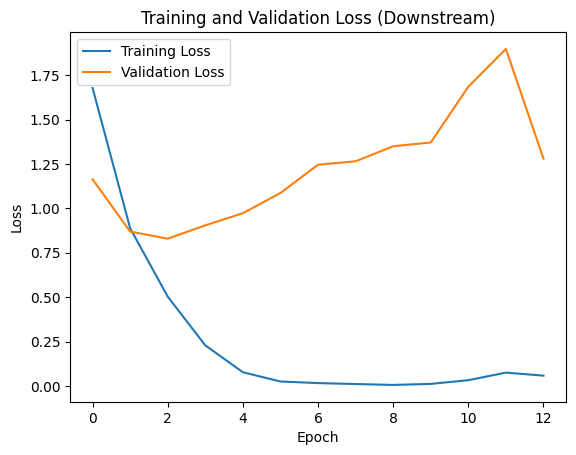

Validation Accuracy: 71.50%, Top-5 Accuracy: 97.70%


In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import torchvision.models as models

# Define the transform
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Load the STL-10 training dataset
trainset_full = torchvision.datasets.STL10(root='./data',  split='train', download=True, transform=transform)

# Split the training dataset into train and validation sets (80% train, 20% validation)
train_size = int(0.8 * len(trainset_full))
val_size = len(trainset_full) - train_size
trainset, valset = random_split(trainset_full, [train_size, val_size])

# Create DataLoader for the train set
trainloader = DataLoader(trainset, batch_size=64, shuffle=True)

# Create DataLoader for the validation set
valloader = DataLoader(valset, batch_size=64, shuffle=False)

# Load the STL-10 test dataset
testset = torchvision.datasets.STL10(root='./data', split='test', download=True, transform=transform)
testloader = DataLoader(testset, batch_size=64, shuffle=False)

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the Downstream Classifier
class DownstreamClassifier(nn.Module):
    def __init__(self, feature_extractor, num_classes=10):
        super(DownstreamClassifier, self).__init__()
        self.feature_extractor = feature_extractor
        self.classifier = nn.Linear(512, num_classes)  # Adjust input size based on your feature extractor output

    def forward(self, x):
        x = self.feature_extractor(x)  # Use feature extractor
        x = nn.functional.adaptive_avg_pool2d(x, (1, 1))  # Average pool to (1, 1)
        x = torch.flatten(x, 1)  # Flatten the features
        x = self.classifier(x)  # Classify
        return x

# Load the ResNet rotation model's backbone
backbone = models.resnet18(weights=None)
backbone = nn.Sequential(*list(backbone.children())[:-2])  # Remove the last fully connected layer

# Initialize the ResNet rotation model
rotation_model = ResNetRotation()  # This should be defined in your code
rotation_weights_path = 'jigsaw_rotation_pretext_cross_entropy_model_STL10.pth'  # Adjust to your path

# Adjust the state_dict keys to match the model
rotation_weights = torch.load(rotation_weights_path, map_location=device)
adjusted_weights = {}
for key in rotation_weights.keys():
    if not key.startswith("base."):
        adjusted_weights[f"base.{key}"] = rotation_weights[key]
    else:
        adjusted_weights[key] = rotation_weights[key]

# Load the adjusted state_dict into the model
rotation_model.load_state_dict(adjusted_weights, strict=False)

# Initialize DownstreamClassifier with rotation_model's backbone
downstream_model = DownstreamClassifier(rotation_model.base).to(device)  # Using the base ResNet

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(downstream_model.parameters(), lr=0.001)

# Prepare for fine-tuning
num_epochs = 150  # Adjust epochs as needed
train_losses = []
val_losses = []

# Early stopping parameters
patience = 10
best_val_loss = float('inf')
patience_counter = 0

# Training loop for downstream classification
for epoch in range(num_epochs):
    # Training phase
    downstream_model.train()
    running_loss = 0.0
    for images, labels in trainloader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        # Forward pass
        outputs = downstream_model(images)

        # Compute loss
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_loss = running_loss / len(trainloader)
    train_losses.append(train_loss)

    # Validation phase
    downstream_model.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for images, labels in valloader:
            images, labels = images.to(device), labels.to(device)
            outputs = downstream_model(images)

            # Compute validation loss
            val_loss = criterion(outputs, labels)
            running_val_loss += val_loss.item()

    val_loss = running_val_loss / len(valloader)
    val_losses.append(val_loss)

    print(f'Epoch {epoch + 1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

    # Early stopping check
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        # Save the best model
        torch.save(downstream_model.state_dict(), 'jigsaw_rotation_best_downstream_classifier_model.pth')
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# Plot training and validation losses
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss (Downstream)')
plt.show()

# Function to evaluate the downstream classifier
def evaluate_model(model, loader):
    model.eval()
    correct = 0
    total = 0
    top5_correct = 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Top-5 accuracy calculation
            top5_correct += (outputs.topk(5, dim=1).indices == labels.view(-1, 1)).sum().item()

    accuracy = correct / total
    top5_accuracy = top5_correct / total
    return accuracy, top5_accuracy

# Evaluate on validation set
val_accuracy, val_top5_accuracy = evaluate_model(downstream_model, valloader)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%, Top-5 Accuracy: {val_top5_accuracy * 100:.2f}%')

# Save the downstream model
torch.save(downstream_model.state_dict(), 'jigsaw_rotation_downstream_classifier_model.pth')


# Downstream Task using Places365

In [13]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch import nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import numpy as np
from torchvision.transforms import functional as TF
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn.functional as F
from IPython.display import clear_output


In [14]:
def show_images(loader):
    images, labels = next(iter(loader))
    grid_img = torchvision.utils.make_grid(images, nrow=8)
    plt.figure(figsize=(12, 12))
    plt.imshow(grid_img.permute(1, 2, 0).numpy())
    plt.axis('off')
    plt.show()

In [15]:
# Modified transform to ensure all images are RGB
transform = transforms.Compose([
    # transforms.Resize((96, 96)),
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB by duplicating channels
    transforms.ToTensor(),
])

# Load the CALTECH101 dataset with the new transform
trainset_full = torchvision.datasets.Caltech101(root='./data', download=True, transform=transform)

# Split into train and validation sets (80-20 split)
train_size = int(0.8 * len(trainset_full))
val_size = len(trainset_full) - train_size
trainset, valset = random_split(trainset_full, [train_size, val_size])

# Create DataLoaders
trainloader = DataLoader(trainset, batch_size=64, shuffle=True)
valloader = DataLoader(valset, batch_size=64, shuffle=False)

print(f"Train set size: {train_size}")
print(f"Validation set size: {val_size}")

Files already downloaded and verified
Train set size: 6941
Validation set size: 1736


In [16]:
class PretrainedModel(nn.Module):
    def __init__(self):
        super(PretrainedModel, self).__init__()
        # Only changing the first conv layer to match pretrained weights
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),  # Changed from 3x3 to 7x7
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten()
        )

# Rest of the code remains the same
class DownstreamClassifier(nn.Module):
    def __init__(self, backbone, num_classes=101):
        super(DownstreamClassifier, self).__init__()
        self.backbone = backbone
        self.classifier = nn.Linear(512, num_classes)

    def forward(self, x):
        with torch.no_grad():  # Freeze the backbone
            features = self.backbone(x)
        return self.classifier(features)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load and rename the state dict
state_dict = torch.load('/users/soh62/SSL-Project-seq/jigsaw_rotation/jigsaw_rotation_pretext_cross_entropy_model_STL10.pth')

# Load the pretrained model
pretext_model = PretrainedModel()
pretext_model.load_state_dict(state_dict, strict=False)

# Create downstream model
downstream_model = DownstreamClassifier(pretext_model.backbone, num_classes=101)
downstream_model = downstream_model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(downstream_model.classifier.parameters(), lr=0.001)

Using device: cuda


/tmp/ipykernel_2232003/2174087959.py:47: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('/users/soh62/SSL-Project-seq/jigsaw_rotation/jigsaw_rotation_

In [17]:
# Initialize lists to store metrics for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
epochs_list = []

def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, epochs_list):
    clear_output(wait=True)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot losses
    ax1.plot(epochs_list, train_losses, label='Training Loss', marker='o')
    ax1.plot(epochs_list, val_losses, label='Validation Loss', marker='o')
    ax1.set_title('Training and Validation Losses')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)
    
    # Plot accuracies
    ax2.plot(epochs_list, train_accuracies, label='Training Accuracy', marker='o')
    ax2.plot(epochs_list, val_accuracies, label='Validation Accuracy', marker='o')
    ax2.set_title('Training and Validation Accuracies')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()

In [19]:
# Training parameters
num_epochs = 150
early_stopping_patience = 15
best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(num_epochs):
    downstream_model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    # Training phase
    for images, labels in trainloader:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = downstream_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Calculate training accuracy
        _, predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

    avg_train_loss = running_loss / len(trainloader)
    train_accuracy = 100 * train_correct / train_total

    # Validation phase
    downstream_model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in valloader:
            images, labels = images.to(device), labels.to(device)
            outputs = downstream_model(images)
            val_loss += criterion(outputs, labels).item()
            
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(valloader)
    val_accuracy = 100 * val_correct / val_total

    # Store metrics
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    epochs_list.append(epoch + 1)

    # Print metrics
    print(f"Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%")
    print(f"Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

    # Plot current metrics
    if (epoch + 1) % 5 == 0:  # Plot every 5 epochs
        plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, epochs_list)

    # Model checkpointing and early stopping
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(downstream_model.state_dict(), 'caltech101_best_downstream_model.pth')
        print(f"Model saved at Epoch {epoch+1}")
        no_improve_epochs = 0
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stopping_patience:
            print("Early stopping triggered")
            break

print("\nTraining completed!")

Epoch [1/150]
Train Loss: 3.0531, Train Accuracy: 33.66%
Val Loss: 3.1417, Val Accuracy: 34.10%
Model saved at Epoch 1
Epoch [2/150]
Train Loss: 3.0160, Train Accuracy: 34.51%
Val Loss: 3.1135, Val Accuracy: 34.39%
Model saved at Epoch 2
Epoch [3/150]
Train Loss: 2.9674, Train Accuracy: 35.33%
Val Loss: 3.0218, Val Accuracy: 37.04%
Model saved at Epoch 3
Epoch [4/150]
Train Loss: 2.9329, Train Accuracy: 36.02%
Val Loss: 3.0225, Val Accuracy: 35.89%
Epoch [5/150]
Train Loss: 2.9066, Train Accuracy: 35.61%
Val Loss: 3.0371, Val Accuracy: 36.12%
Epoch [6/150]
Train Loss: 2.8772, Train Accuracy: 36.45%
Val Loss: 2.9570, Val Accuracy: 38.94%
Model saved at Epoch 6
Epoch [7/150]
Train Loss: 2.8424, Train Accuracy: 37.34%
Val Loss: 2.9287, Val Accuracy: 38.71%
Model saved at Epoch 7
Epoch [8/150]
Train Loss: 2.8068, Train Accuracy: 37.60%
Val Loss: 2.9304, Val Accuracy: 38.59%
Epoch [9/150]
Train Loss: 2.7666, Train Accuracy: 38.63%
Val Loss: 2.9038, Val Accuracy: 38.19%
Model saved at Epoch 

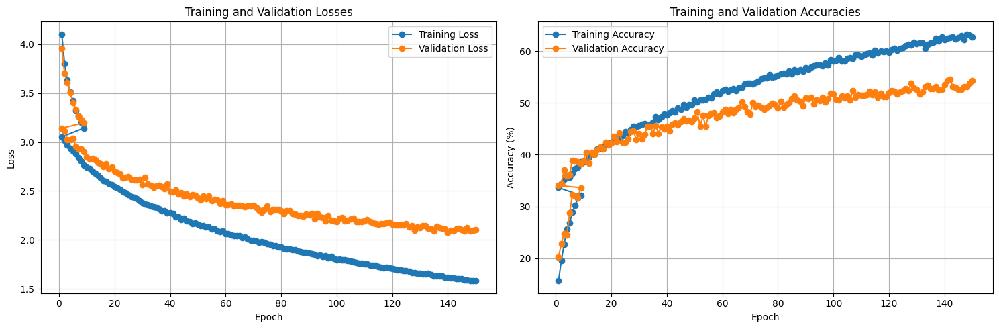

In [20]:
# Plot final training metrics
plt.figure(figsize=(15, 5))

# Plot losses
plt.subplot(1, 2, 1)
plt.plot(epochs_list, train_losses, label='Training Loss', marker='o')
plt.plot(epochs_list, val_losses, label='Validation Loss', marker='o')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot accuracies
plt.subplot(1, 2, 2)
plt.plot(epochs_list, train_accuracies, label='Training Accuracy', marker='o')
plt.plot(epochs_list, val_accuracies, label='Validation Accuracy', marker='o')
plt.title('Training and Validation Accuracies')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('training_metrics.png')
plt.show()

In [21]:
def evaluate_model(model, loader):
    model.eval()
    correct = 0
    top3_correct = 0
    top5_correct = 0
    total = 0
    
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            
            # Top-1 accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Top-3 and Top-5 accuracy
            _, top_k = outputs.topk(5, 1, True, True)
            top_k = top_k.t()
            correct_k = top_k.eq(labels.view(1, -1).expand_as(top_k))
            
            top3_correct += correct_k[:3].reshape(-1).float().sum(0, keepdim=True).item()
            top5_correct += correct_k[:5].reshape(-1).float().sum(0, keepdim=True).item()

    return {
        'top1_acc': 100 * correct / total,
        'top3_acc': 100 * top3_correct / total,
        'top5_acc': 100 * top5_correct / total
    }

# Evaluate on validation set
results = evaluate_model(downstream_model, valloader)
print("Final Model Performance:")
print(f"Top-1 Accuracy: {results['top1_acc']:.2f}%")
print(f"Top-3 Accuracy: {results['top3_acc']:.2f}%")
print(f"Top-5 Accuracy: {results['top5_acc']:.2f}%")

Final Model Performance:
Top-1 Accuracy: 54.38%
Top-3 Accuracy: 65.96%
Top-5 Accuracy: 71.54%


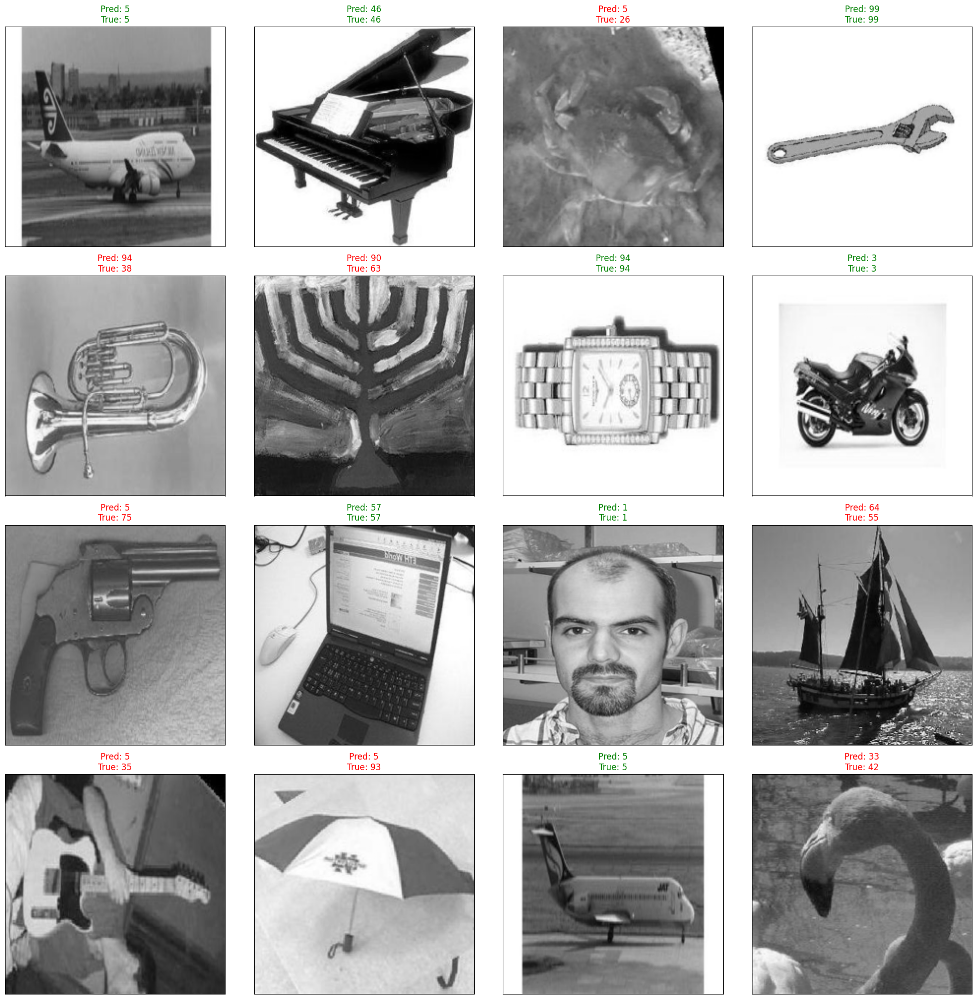

In [22]:
def visualize_predictions(model, loader, num_images=16):
    model.eval()
    images, labels = next(iter(loader))
    images = images[:num_images].to(device)
    labels = labels[:num_images]
    
    with torch.no_grad():
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
    
    fig = plt.figure(figsize=(20, 20))
    for idx in range(num_images):
        ax = fig.add_subplot(4, 4, idx+1, xticks=[], yticks=[])
        img = images[idx].cpu().permute(1, 2, 0)
        plt.imshow(img)
        
        color = 'green' if preds[idx] == labels[idx] else 'red'
        ax.set_title(f'Pred: {preds[idx]}\nTrue: {labels[idx]}', color=color)
    
    plt.tight_layout()
    plt.savefig('prediction_samples.png')
    plt.show()

# Visualize some predictions
visualize_predictions(downstream_model, valloader)